# Age and Gender classification
# Exploratory Data Analysis

## Introduction

In this project, we aim to tackle the task of age and gender classification from facial images using the UTKFace dataset. This is a classic multi-task learning problem where the model is expected to predict both age and gender from a single image. By leveraging neural networks, the goal is to build a single model that can efficiently perform both tasks in parallel.

## Data Analysis

### About the Dataset

The UTKFace dataset is a large-scale facial image dataset, containing over 20,000 images of faces with annotations for age, gender, and ethnicity. The images in the dataset feature a diverse range of human faces, captured in varying conditions including different poses, lighting environments, and facial expressions. This diversity makes it a valuable resource for training robust machine learning models, particularly in multi-task learning scenarios where age and gender are predicted simultaneously.

**Labels**

The labels for each image are embedded directly in the file name, formatted as follows:

[age] _ [gender] _ [race] _ [date&time].jpg

The label components are:

**[age]:** An integer ranging from **0** to **116**, indicating the person's age.

**[gender]:** A binary label where **0** represents male and **1** represents female.

**[race]:** An integer from **0** to **4**, indicating the person’s race/ethnicity:

* **0:** White
* **1:** Black
* **2:** Asian
* **3:** Indian
* **4:** Others (Hispanic, Latino, Middle Eastern, etc.)

**[date&time]:** A timestamp in the format yyyymmddHHMMSSFFF, indicating when the image was collected.

**Image Properties**

* The images have varying dimensions and are generally resized to a uniform size (e.g., 128x128 pixels) before being used in model training.
* The images are RGB color images.


For more details, visit the official page: [UTKFace Dataset](https://susanqq.github.io/UTKFace/).

### Environment setup

In [1]:
import sys
import os
sys.path
sys.path.append('..')
import shutil

import pandas as pd
import numpy as np
import re

from PIL import Image
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA

from utils import compare_folders
from utils import validate_and_display_images
from utils import extract_class_data, get_class_ranges
from utils import check_image_file_accessibility
from utils import plot_image_dimensions
from utils import capture_faces_fan, capture_faces_mtcnn, display_images_no_faces
from utils import load_images_as_flattened_array, plot_principal_components_as_images
from utils import plot_pie_chart, plot_age_distribution_line, plot_age_barplots
from utils import plot_grouped_bar

import torch
print(f"Is CUDA available: {torch.cuda.is_available()}")

Is CUDA available: True


### Data Duplication Check

In this step, we are verifying whether the outer and inner folders contain identical files. These folders have the same structure, and this check ensures that there are no duplicated files between them. We use file name comparison and SHA256 hashing to confirm both the names and content of the files are identical. By eliminating any redundant data, we can streamline the dataset and avoid potential biases or inefficiencies during model training.

#### Inner and Outer folders check

In [2]:
outer = '../data/original/outer'
inner = '../data/original/inner'

unique_in_folder1, unique_in_folder2 = compare_folders(outer, inner)

File names are identical in both folders.


Comparing files: 100%|████████████████████████████████████████████████████████| 33488/33488 [01:45<00:00, 318.02file/s]


Number of identical files: 33488
Number of unique files: 0
Number of unique files in ../data/original/outer: 0
Number of unique files in ../data/original/inner: 0


#### Inner Folder Check

In [3]:
inner_folder1 = '../data/original/inner/crop_part1'
inner_folder2 = '../data/original/inner/UTKFace'

unique_in_folder1, unique_in_folder2 = compare_folders(inner_folder1, inner_folder2)

File names differ between the folders.


Comparing files: 100%|█████████████████████████████████████████████████████████| 9779/9779 [00:01<00:00, 5351.28file/s]


Number of identical files: 9779
Number of unique files: 0
Number of unique files in ../data/original/inner/crop_part1: 1
Number of unique files in ../data/original/inner/UTKFace: 13929


In [4]:
unique_in_folder1

['61_3_20170109150557335.jpg.chip.jpg']

In [5]:
image_path = os.path.join(inner_folder1, unique_in_folder1[0])

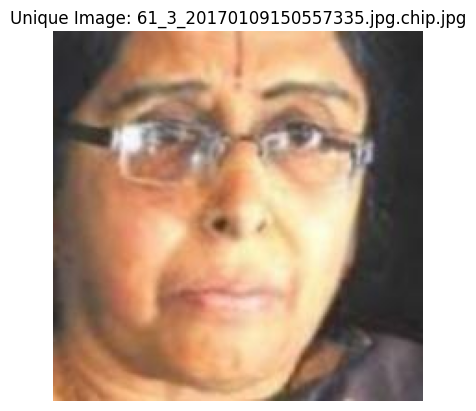

In [6]:
img = Image.open(image_path)
plt.imshow(img)
plt.axis('off')
plt.title(f"Unique Image: {unique_in_folder1[0]}")
plt.show()

In [7]:
path_data = inner_folder2

#### Conclusion

Upon performing a detailed comparison between the inner and outer directories, we discovered the following:

* Number of identical files: 9,779 files were found to be identical between the crop_part1 and UTKFace directories.
* Number of different files: 0 files were different between the directories.
* Unique file in inner/crop_part1: One image, 61_3_20170109150557335.jpg.chip.jpg, was found to be unique to the inner/crop_part1 directory.
* Unique files in inner/UTKFace: 13,929 files are unique to the inner/UTKFace directory and do not exist in the outer directory.
* After visualizing the unique image, we concluded that this image will not be used in the dataset because it does not have a clear gender label, which is required for our classification tasks.

**Final Decision:**
We will use the inner/UTKFace directory as the primary data source for this project since it contains the complete set of images, and all other images in the crop_part1 directory are duplicates. By doing so, we ensure that our dataset is clean, non-redundant, and suitable for the upcoming steps in our multi-task learning model.

### Class Label and File Extension Verification

In this step, we will verify if all image files in the ../data/original/inner/UTKFace directory follow the expected file name format for class labels. The file name format is expected to be:

[age] _ [gender] _ [race] _ [date&time].jpg

Each file name should contain four components:

**[age]:** An integer ranging from **0** to **116**, indicating the person's age.

**[gender]:** A binary label where **0** represents male and **1** represents female.

**[race]:** An integer from **0** to **4**, indicating the person’s race/ethnicity:

* **0:** White
* **1:** Black
* **2:** Asian
* **3:** Indian
* **4:** Others (Hispanic, Latino, Middle Eastern, etc.)

**[date&time]:** A timestamp in the format yyyymmddHHMMSSFFF, indicating when the image was collected.

Total number of files: 23708
Number of preprocessed '.chip.jpg' files: 23708
Number of files with invalid format: 3
Invalid files: ['39_1_20170116174525125.jpg.chip.jpg', '61_1_20170109142408075.jpg.chip.jpg', '61_1_20170109150557335.jpg.chip.jpg']


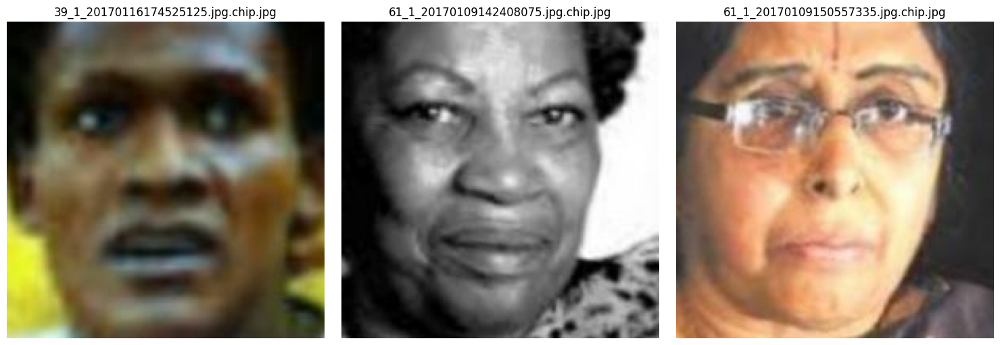

In [8]:
validate_and_display_images(path_data)

During the validation process, we checked the naming conventions of all files in the ../data/original/inner/UTKFace directory to ensure they followed the expected format for class labels. This format includes components for age, gender, race, and timestamp.

Out of a total of 23,708 files, three files were found to have an invalid format:

* 39_1_20170116174525125.jpg.chip.jpg
* 61_1_20170109142408075.jpg.chip.jpg
* 61_1_20170109150557335.jpg.chip.jpg
* 
These images lack a race class in their file names, which is a critical component for multi-class classification in our model. Therefore, these images will be excluded from the training dataset to ensure the consistency and integrity of the input data.

In addition, all 23,708 files were preprocessed, as indicated by the .chip.jpg extension. The valid files will proceed to the next step of the data preparation and model training pipeline, while the invalid files will not be used for model training due to missing race class information.

#### Class Labels extraction

Using the filenames in the dataset, which contain embedded labels for age, gender, and race, we extracted these labels and organized them into a structured pandas DataFrame.

In [9]:
df_labels = extract_class_data(path_data)

In [10]:
df_labels.sample(10)

,filename,age,gender,race
17550,49_1_0_20170109221146542.jpg.chip.jpg,49,1,0
17121,47_0_0_20170104210614252.jpg.chip.jpg,47,0,0
14645,38_1_0_20170105170148788.jpg.chip.jpg,38,1,0
4828,24_1_3_20170104222905601.jpg.chip.jpg,24,1,3
5361,25_1_0_20170117140238688.jpg.chip.jpg,25,1,0
7195,26_1_1_20170116223229525.jpg.chip.jpg,26,1,1
18530,52_0_3_20170119205712208.jpg.chip.jpg,52,0,3
10686,30_0_1_20170116010614771.jpg.chip.jpg,30,0,1
20805,62_0_0_20170104170229321.jpg.chip.jpg,62,0,0
14399,37_1_0_20170119202548638.jpg.chip.jpg,37,1,0


In [11]:
print(df_labels[df_labels[['age', 'gender', 'race']].isna().any(axis=1)])

                                  filename  age gender race
15015  39_1_20170116174525125.jpg.chip.jpg  NaN    NaN  NaN
20793  61_1_20170109142408075.jpg.chip.jpg  NaN    NaN  NaN
20794  61_1_20170109150557335.jpg.chip.jpg  NaN    NaN  NaN


After extracting the class labels from the filenames, we identified 3 filenames that do not provide complete information for age, gender, and race. These filenames do not follow the expected format and, as a result, have missing values (NaN) for the corresponding labels.

Since complete label information is critical for accurate model training, these rows will be removed from the dataset, and the corresponding images will not be used in the model training process. This ensures that only data with complete class labels are included, maintaining the integrity and consistency of the training dataset.

In [12]:
df_labels_clean = df_labels.dropna(subset=['age', 'gender', 'race'])
print(df_labels_clean[df_labels_clean[['age', 'gender', 'race']].isna().any(axis=1)])

Empty DataFrame
Columns: [filename, age, gender, race]
Index: []


#### Verifying Label Value Ranges

Since the dataset has predefined label values for age, gender, and race, we check the ranges of these extracted labels to ensure they align with the provided information:

**[age]:** An integer ranging from **0** to **116**, indicating the person's age.

**[gender]:** A binary label where **0** represents male and **1** represents female.

**[race]:** An integer from **0** to **4**, indicating the person’s race/ethnicity:

* **0:** White
* **1:** Black
* **2:** Asian
* **3:** Indian
* **4:** Others (Hispanic, Latino, Middle Eastern, etc.)

In [13]:
class_ranges = get_class_ranges(df_labels_clean)

print("Class Ranges:")
print(f"Age Range: {class_ranges['age']}")
print(f"Gender Range: {class_ranges['gender']}")
print(f"Race Range: {class_ranges['race']}")

Class Ranges:
Age Range: (1, 116)
Gender Range: (0, 1)
Race Range: (0, 4)


The extracted ranges match the expected values, confirming that the data is correctly labeled.

### Image Accessibility and Quality Check

In this section, we perform a thorough Image Accessibility and Quality Check to ensure that all the image files in our dataset are properly accessible and suitable for model training. The process involves two key steps:

File Accessibility Check: We verify that each image file can be opened without errors, ensuring there are no corrupted or missing files. This step ensures that the files will be correctly passed to the model during training.

File Size and Dimension Check: We assess the sizes and dimensions of the images to confirm consistency across the dataset. Images with varying dimensions or sizes might need to be resized or handled separately to avoid issues during model training.

By ensuring both accessibility and uniformity in file dimensions, we can maintain the quality of the dataset and avoid potential issues during the model development process.

#### Image Accessibility

In [14]:
image_file_accessibility = check_image_file_accessibility(path_data, df_labels_clean)

print(f"Number of valid image files: {len(image_file_accessibility['valid'])}")
print(f"Number of invalid image files: {len(image_file_accessibility['invalid'])}")

Checking image files: 100%|████████████████████████████████████████████████████| 23705/23705 [00:02<00:00, 8245.49it/s]

Number of valid image files: 23705
Number of invalid image files: 0


All of the provided files are accesible as image.

#### Image Dimensions

Gathering image dimensions: 100%|██████████████████████████████████████████████| 23705/23705 [00:02<00:00, 8259.73it/s]


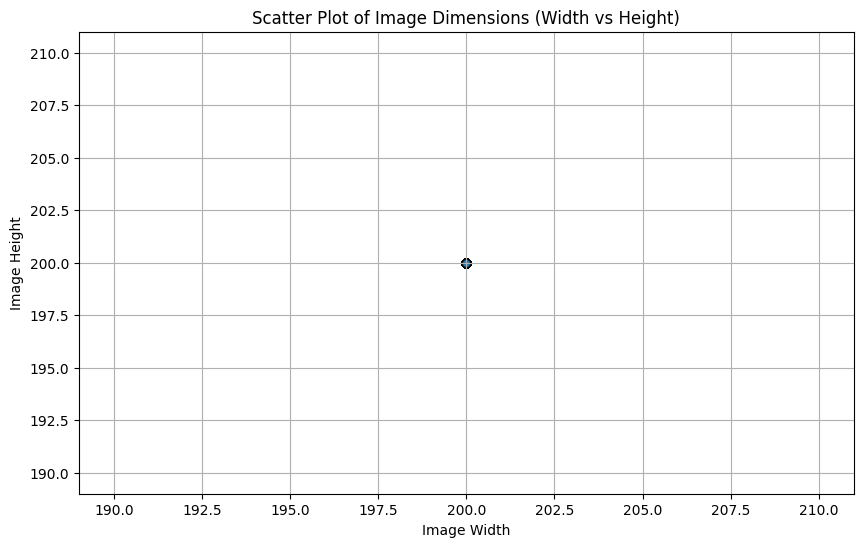

In [15]:
plot_image_dimensions(path_data, df_labels_clean)

From the scatter plot of image dimensions, it is evident that all images in the dataset have the same size. The data points are concentrated at a single location on the plot, confirming that every image has the same width and height. This consistency in image dimensions ensures that no further resizing or preprocessing related to image size is required before feeding the data into the model for training.

#### Content of the Image

To ensure that the images in our dataset contain identifiable faces, we applied face detection procedure. This method was applied to confirm the presence of faces in each image within our dataset, which is crucial for the success of our face-based classification tasks.

In [16]:
df_labels_with_faces = capture_faces_fan(path_data, df_labels_clean)

Processing faces with FAN:   5%|██▌                                               | 1243/23705 [00:50<12:08, 30.83it/s]C:\Users\MiestoMeska\anaconda3\envs\TC_4\lib\site-packages\face_alignment\api.py:147: UserWarning: No faces were detected.
  warnings.warn("No faces were detected.")
Processing faces with FAN:   7%|███▍                                              | 1629/23705 [01:03<14:11, 25.91it/s]C:\Users\MiestoMeska\anaconda3\envs\TC_4\lib\site-packages\face_alignment\api.py:147: UserWarning: No faces were detected.
  warnings.warn("No faces were detected.")
Processing faces with FAN:   7%|███▍                                              | 1639/23705 [01:03<14:06, 26.06it/s]C:\Users\MiestoMeska\anaconda3\envs\TC_4\lib\site-packages\face_alignment\api.py:147: UserWarning: No faces were detected.
  warnings.warn("No faces were detected.")
Processing faces with FAN:  10%|████▊                                             | 2258/23705 [01:23<11:35, 30.84it/s]C:\Users\MiestoMeska\anaco

If the FAN model detected a face in an image, the image was marked as containing a face (face_found = 1). If no face was detected, it was marked as having no face (face_found = 0).

In [17]:
df_labels_with_faces_extended = capture_faces_mtcnn(path_data, df_labels_clean)

Processing faces with MTCNN: 100%|███████████████████████████████████████████████| 23705/23705 [06:33<00:00, 60.31it/s]


If the MTCNN model detected a face in an image, the image was marked as containing a face (face_found_pytorch = 1). If no face was detected, it was marked as having no face (face_found_pytorch = 0).

In [18]:
df_labels_recognized = pd.merge(
    df_labels_with_faces_extended,
    df_labels_with_faces,
    on=['filename', 'age', 'gender', 'race'],
    how='inner',
    suffixes=('_extended', '_original')
)

print(df_labels_recognized.sample(5))

                                    filename age gender race  \
18047  50_0_2_20170119205049471.jpg.chip.jpg  50      0    2   
13995  36_1_0_20170105164513676.jpg.chip.jpg  36      1    0   
15271   3_1_2_20161219190118219.jpg.chip.jpg   3      1    2   
13933  36_0_3_20170119201743421.jpg.chip.jpg  36      0    3   
10300   2_1_1_20170109190932811.jpg.chip.jpg   2      1    1   

       face_found_mtcnn  face_found  
18047                 1           1  
13995                 1           1  
15271                 1           1  
13933                 1           1  
10300                 1           1  


In [19]:
face_found_counts = df_labels_recognized['face_found'].value_counts()
face_found_mtcnn_counts = df_labels_recognized['face_found_mtcnn'].value_counts()

print("Counts in 'face_found':")
print(face_found_counts)
print("\nCounts in 'face_found_mtcnn':")
print(face_found_mtcnn_counts)

Counts in 'face_found':
face_found
1    23657
2       36
0       11
3        1
Name: count, dtype: int64

Counts in 'face_found_mtcnn':
face_found_mtcnn
1    23582
0       83
2       40
Name: count, dtype: int64


**Creating a checkpoint.**

In [20]:
output_path = '../data/df_labels_recognized.csv'
df_labels_recognized.to_csv(output_path, index=False)

print(f"DataFrame saved.")

DataFrame saved.


In [21]:
df_labels_recognized = pd.read_csv(output_path)

#### Images with failed Face Recognition

In [22]:
FAN_column = "face_found"

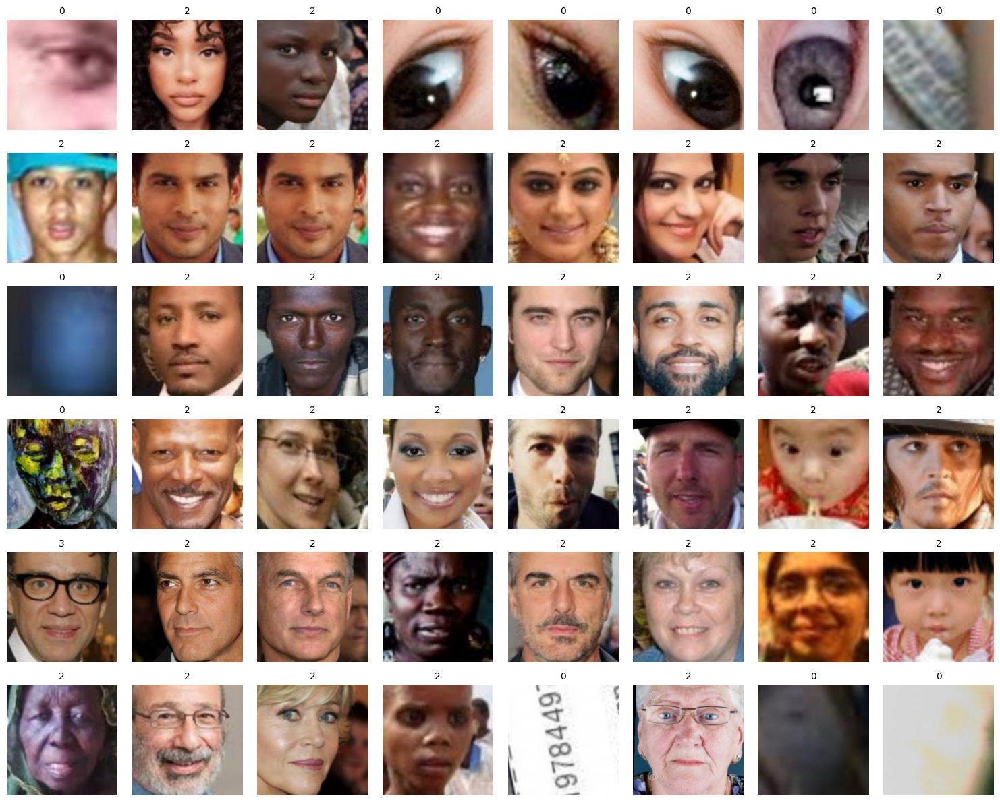

In [23]:
display_images_no_faces(path_data, df_labels_recognized, FAN_column, 8)

In [24]:
MTCNN_column = "face_found_mtcnn"

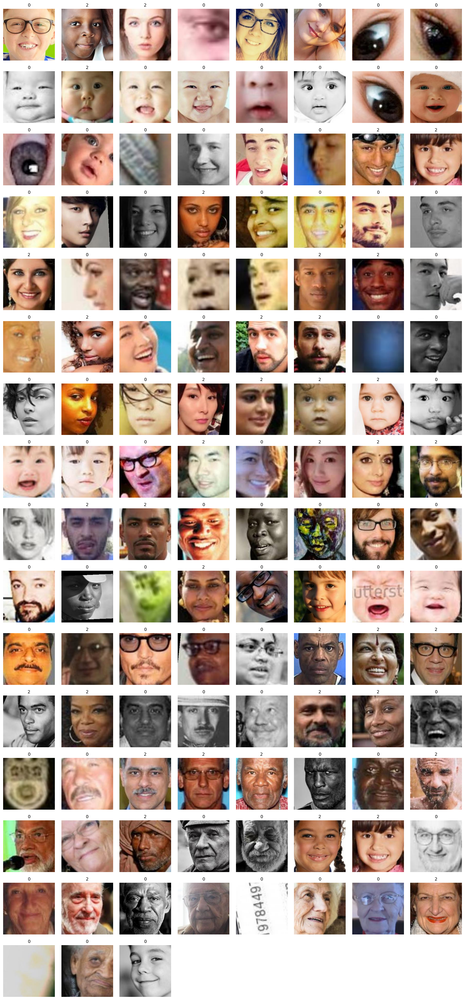

In [25]:
display_images_no_faces(path_data, df_labels_recognized, MTCNN_column, 8)

In [26]:
both_zero = df_labels_recognized[(df_labels_recognized['face_found'] == 0) & (df_labels_recognized['face_found_mtcnn'] == 0)]
both_more_than_one = df_labels_recognized[(df_labels_recognized['face_found'] > 1) & (df_labels_recognized['face_found_mtcnn'] > 1)]
only_face_found_zero_or_more_than_one = df_labels_recognized[
    (df_labels_recognized['face_found'] == 0) | (df_labels_recognized['face_found'] > 1)
]
only_face_found_mtcnn_zero_or_more_than_one = df_labels_recognized[
    (df_labels_recognized['face_found_mtcnn'] == 0) | (df_labels_recognized['face_found_mtcnn'] > 1)
]

print("Rows where both models found 0 faces:", len(both_zero))
print("Rows where both models found more than 1 face:", len(both_more_than_one))
print("Rows where only FAN found 0 or more than 1 face:", len(only_face_found_zero_or_more_than_one))
print("Rows where only MTCNN found 0 or more than 1 face:", len(only_face_found_mtcnn_zero_or_more_than_one))

Rows where both models found 0 faces: 10
Rows where both models found more than 1 face: 1
Rows where only FAN found 0 or more than 1 face: 48
Rows where only MTCNN found 0 or more than 1 face: 123


In [27]:
df_labels_recognized['models_recognized'] = np.where(
    (df_labels_recognized['face_found'] == 1) & (df_labels_recognized['face_found_mtcnn'] == 1),
    1,
    0
)
df_labels_recognized['models_recognized'].value_counts()

models_recognized
1    23545
0      160
Name: count, dtype: int64

In [28]:
df_unrecognized = df_labels_recognized[df_labels_recognized['models_recognized'] == 0]
total_count = len(df_labels_recognized)
race_percentage_unrecognized = (df_unrecognized['race'].value_counts() / total_count) * 100
gender_percentage_unrecognized = (df_unrecognized['gender'].value_counts() / total_count) * 100
age_percentage_unrecognized = (df_unrecognized['age'].value_counts() / total_count) * 100

print("Race percentage of unrecognized images relative to total dataset:")
print(race_percentage_unrecognized)
print("\nGender percentage of unrecognized images relative to total dataset:")
print(gender_percentage_unrecognized)
print("\nAge percentage of unrecognized images relative to total dataset:")
print(age_percentage_unrecognized)

Race percentage of unrecognized images relative to total dataset:
race
0    0.257330
1    0.189833
3    0.101244
2    0.092807
4    0.033748
Name: count, dtype: float64

Gender percentage of unrecognized images relative to total dataset:
gender
0    0.400759
1    0.274204
Name: count, dtype: float64

Age percentage of unrecognized images relative to total dataset:
age
26    0.063278
1     0.054841
28    0.042185
30    0.029530
25    0.021093
        ...   
34    0.004219
33    0.004219
22    0.004219
19    0.004219
9     0.004219
Name: count, Length: 61, dtype: float64


**Face Not Found:** In cases where no face was detected, we visually inspected the images and observed several potential reasons:

* Poor Image Quality: Low resolution or image blur can make it difficult for the model to detect faces.
* Partial or Occluded Faces: Faces that are heavily cropped, obscured, or only partially visible may not be detected by the model.
* Non-human or Non-face Content: A few images that did not conform to expectations (e.g., extreme close-ups of body parts) may be present in the dataset and would not be detected as faces.

Since the collection of images where no face was found makes up only 0.4% of the most effected label class, this small fraction is not substantial enough to affect the overall model performance. Therefore, these images will be dropped from further analysis and model training to ensure the quality and relevance of the dataset.

In [29]:
df_labels_recognized = df_labels_recognized[df_labels_recognized['models_recognized'] == 1].reset_index(drop=True)
print(f"Cleaned dataset shape: {df_labels_recognized.shape}")

Cleaned dataset shape: (23545, 7)


### PCA for Image Feature Evaluation

In this section, we perform Principal Component Analysis (PCA) on a subset of images to evaluate the key features present in the dataset. PCA is a dimensionality reduction technique that helps in identifying the most important patterns in the data by transforming the original variables into a set of linearly uncorrelated components, called principal components.

By applying PCA, we aim to capture the most important facial features in the dataset while reducing the dimensionality of the images. This step provides insights into the overall structure and variance in the dataset, helping us assess the quality of the data in terms of its capacity to capture relevant facial characteristics.

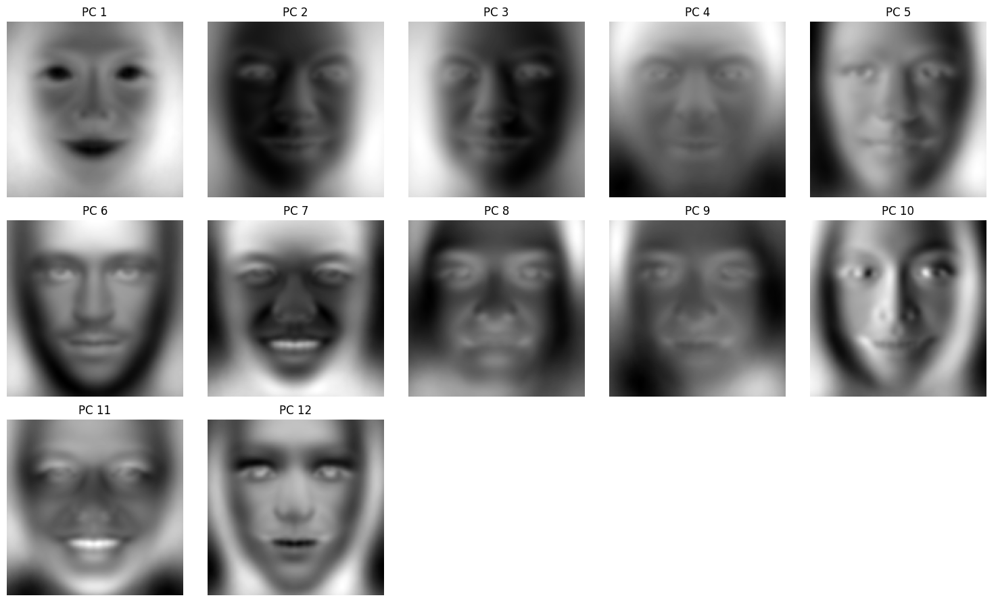

In [30]:
image_data = load_images_as_flattened_array(path_data, df_labels_recognized)

pca = PCA(n_components=50)
pca.fit(image_data)

plot_principal_components_as_images(pca, num_components=12)

The principal component analysis (PCA) results displayed as images provide insights into the major patterns within the dataset. Each principal component (PC) highlights key features that vary across the dataset. Here are some conclusions based on the PCA output:

* Dominant Features: The first few PCs capture the most significant variations within the data. For instance, PC1 highlights general facial structure, such as eyes, mouth, and facial symmetry. Subsequent components (PC2, PC3, etc.) introduce finer details like the nose shape, face contour, and lighting variations.

* Face Variations: PCs like PC4 and PC5 reflect potential variations in skin tone or lighting conditions, while others may reflect gender or other subtle differences in facial characteristics.

* Feature Emphasis: As we move to higher PCs (beyond PC5), the facial details become less sharp, indicating that these components represent more subtle variations in the dataset. This could include minor changes in expression, pose, or lighting, and they capture less of the variance compared to the first few PCs.

* Data Quality and Consistency: The smooth and distinct nature of the principal components suggests that the dataset has a relatively consistent structure, meaning the facial features in the images are well-defined and there’s limited noise. This also reflects the overall quality of the dataset for facial recognition tasks.

In summary, PCA reveals that the dataset captures essential facial features and provides well-defined variations that can be useful for model training. The presence of distinct principal components indicates that the data has sufficient diversity in terms of face shapes, expressions, and other key facial characteristics.

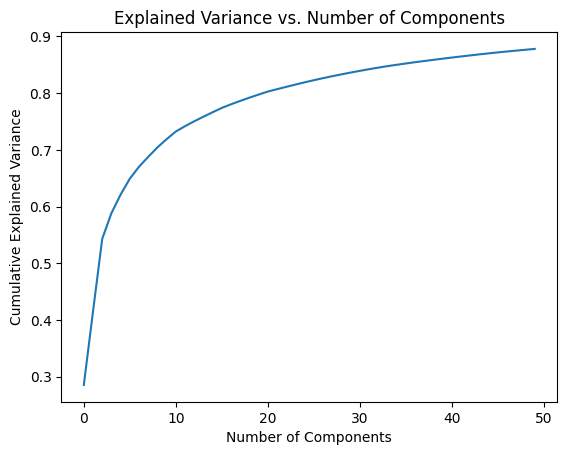

In [31]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.show()

* The first few principal components capture a significant amount of variance, with around 10 components capturing approximately 75% of the total variance.
* After about 30 components, the explained variance increase slows down, indicating diminishing returns with additional components.
* Around 50 components, the cumulative explained variance approaches 85%, meaning that this number of components retains most of the important information from the data.

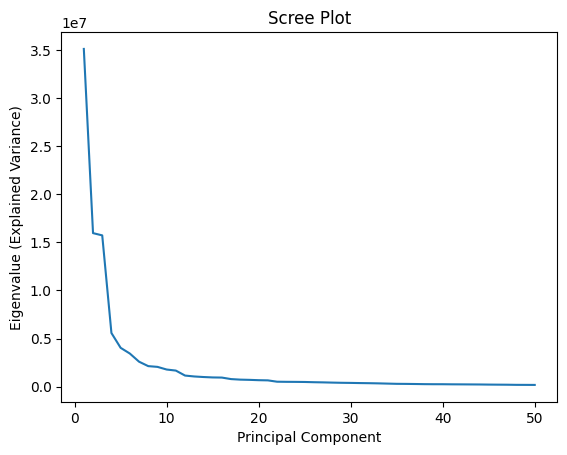

In [32]:
plt.plot(range(1, len(pca.explained_variance_)+1), pca.explained_variance_)
plt.xlabel('Principal Component')
plt.ylabel('Eigenvalue (Explained Variance)')
plt.title('Scree Plot')
plt.show()

After about 10 components, additional components contribute very little to explaining variance.

This suggests that selecting the first 10 components would capture most of the important information, while adding more components beyond this point yields diminishing returns.

### Labels Analysis

In this section, we explore the key demographic labels in the dataset—age, gender, and race. Understanding the distribution of these labels is essential for building an accurate and fair multi-label classification model. 

#### Gender Labels

In [33]:
gender_labels = {0: 'Male', 1: 'Female'}

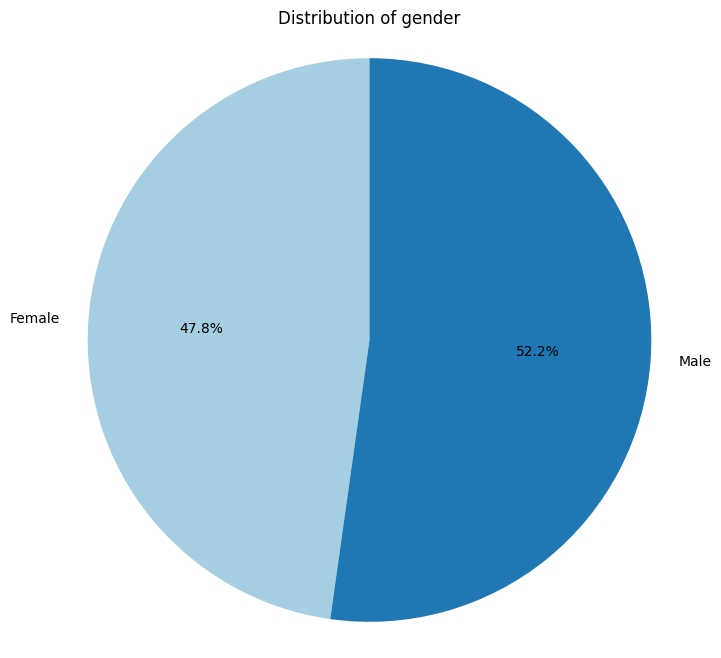

In [34]:
plot_pie_chart(df_labels_recognized, 'gender', label_dict=gender_labels)

The pie chart above illustrates the gender distribution in the dataset. The dataset shows a relatively balanced distribution between males and females, with males constituting 52.3% and females making up 47.7% of the dataset. This near-equal distribution is ideal for ensuring that the model training process does not heavily favor one gender over the other, potentially improving the generalizability and fairness of the model in gender-related predictions.

#### Race Labels

In [35]:
race_labels = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}

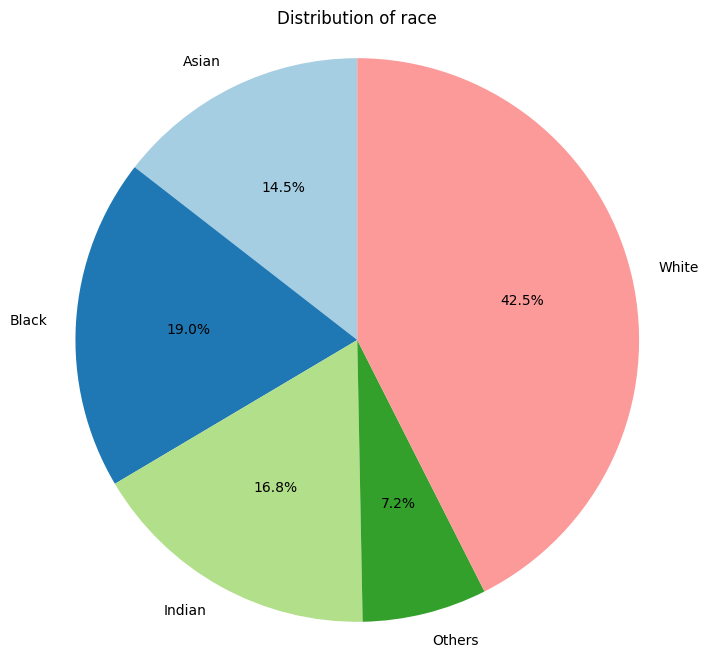

In [36]:
plot_pie_chart(df_labels_recognized, 'race', label_dict=race_labels)

The pie chart above presents the race distribution within the dataset. The largest group is "White," making up 42.5% of the data, followed by "Black" at 19.1%, "Indian" at 16.8%, "Asian" at 14.5%, and "Others" (including Hispanic, Latino, Middle Eastern, etc.) representing 7.1%. This distribution shows diversity across racial categories, although "White" is the most dominant group. This variety ensures that models can be trained to generalize across different ethnicities, but special care should be taken to ensure that the minority categories are not underrepresented in modeling efforts.

#### Age Distribution

In [37]:
df_labels_recognized

,filename,age,gender,race,face_found_mtcnn,face_found,models_recognized
0,100_0_0_20170112213500903.jpg.chip.jpg,100,0,0,1,1,1
1,100_0_0_20170112215240346.jpg.chip.jpg,100,0,0,1,1,1
2,100_1_0_20170110183726390.jpg.chip.jpg,100,1,0,1,1,1
3,100_1_0_20170112213001988.jpg.chip.jpg,100,1,0,1,1,1
4,100_1_0_20170112213303693.jpg.chip.jpg,100,1,0,1,1,1
...,...,...,...,...,...,...,...
23540,9_1_3_20161220222856346.jpg.chip.jpg,9,1,3,1,1,1
23541,9_1_3_20170104222949455.jpg.chip.jpg,9,1,3,1,1,1
23542,9_1_4_20170103200637399.jpg.chip.jpg,9,1,4,1,1,1
23543,9_1_4_20170103200814791.jpg.chip.jpg,9,1,4,1,1,1


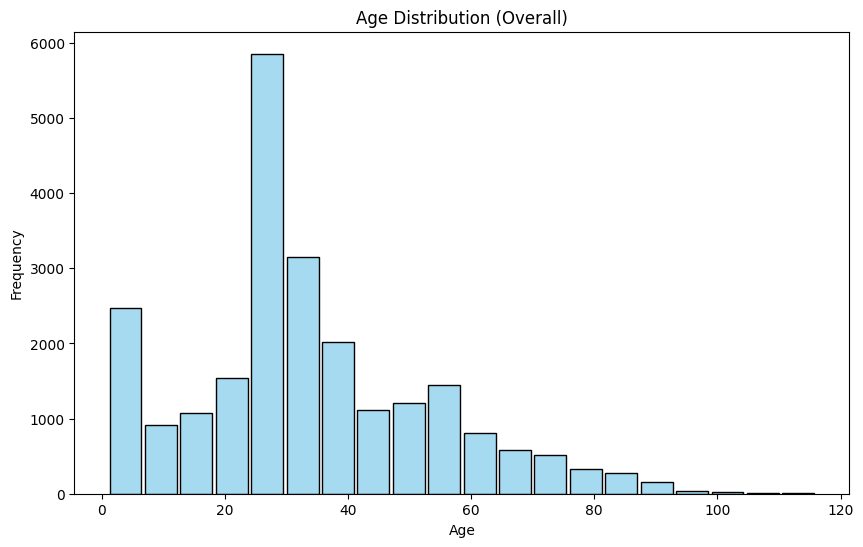

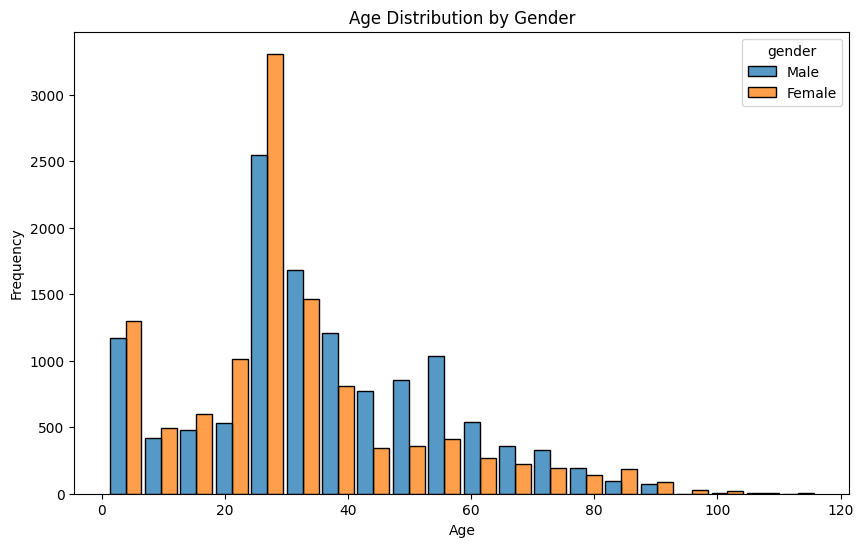

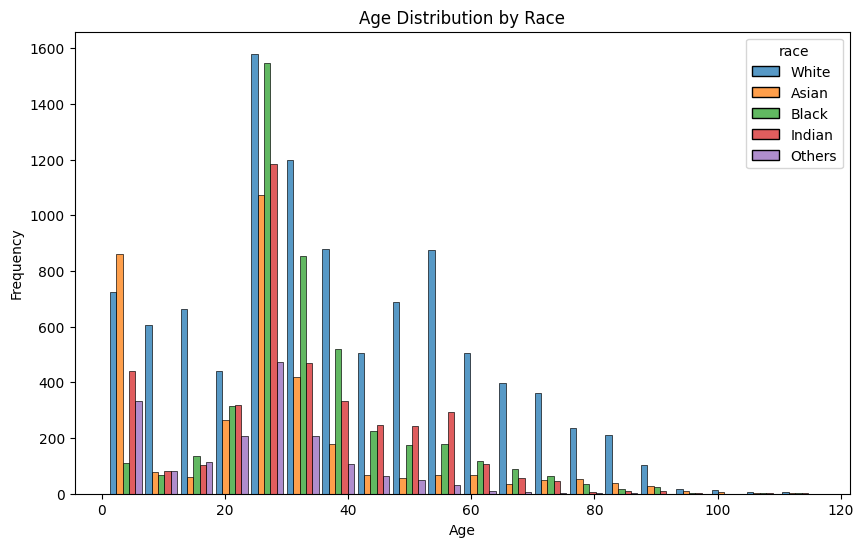

In [38]:
plot_age_barplots(df_labels_recognized, 'age', 'gender', 'race', gender_labels, race_labels)

The age distribution graphs offer key insights into the dataset:

* **Overall Age Distribution:** The overall age distribution shows a peak in the 20-year range, with a steady decline in frequency as age increases. This suggests that the dataset contains a higher proportion of younger individuals.

* **Age Distribution by Gender:** The gender-based age distribution highlights a higher proportion of younger females compared to males, particularly in the 20-year age range. The male distribution is more spread across different age groups, particularly between 40 and 60 years.

* **Age Distribution by Race:** The distribution by race shows that the dataset is predominantly comprised of individuals in the 0–30-year range across all races. However, the white population exhibits a broader age range, while other races show higher concentrations in the younger age groups.

In summary, the dataset has a strong representation of younger individuals, especially females, and there are notable differences in age distribution among the different races, with white individuals having a broader age range.

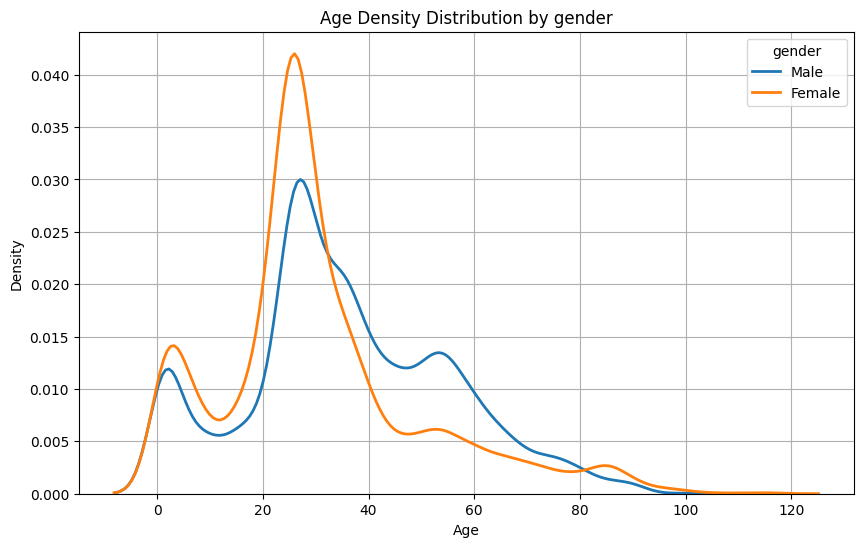

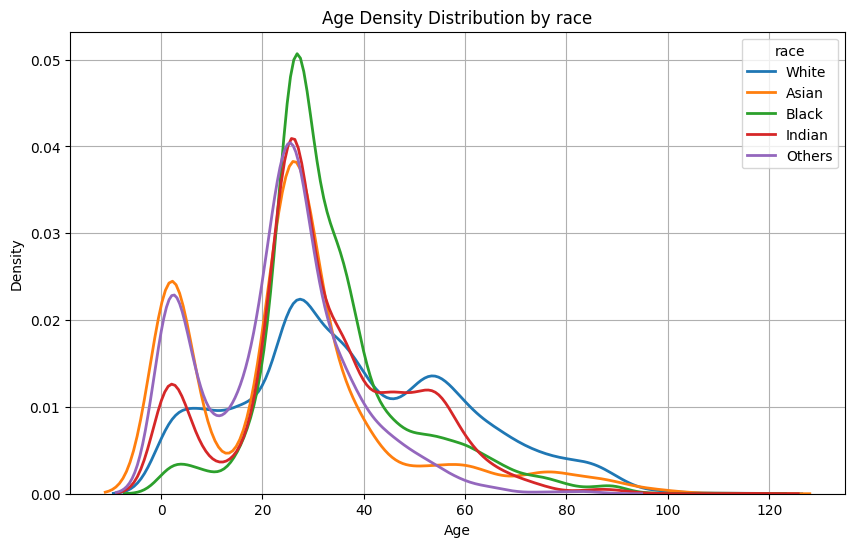

In [39]:
plot_age_distribution_line(df_labels_recognized, age_column='age', secondary_column='gender', secondary_label_dict=gender_labels)
plot_age_distribution_line(df_labels_recognized, age_column='age', secondary_column='race', secondary_label_dict=race_labels)

The age density distribution by gender and race provides some interesting insights:

**Age Distribution by Gender:**

* There is a notable peak in the density distribution around the ages of 20 and 25 for both males and females, indicating that the dataset contains a large proportion of young adults.
* Females have a slightly higher density around the age of 20, indicating that this age group is more represented among females.
* The distribution for both genders follows a similar trend, with a gradual decline in density as age increases, suggesting that the dataset contains fewer older individuals, but males show a more consistent decline in density as age progresses.

**Age Distribution by Race:**

* Across all racial groups, the dataset displays a peak density around the early 20s. However, this peak is most prominent for the Black category.
* The White group has a wider distribution across various age groups, with a slower decline compared to other races, suggesting a more balanced representation across ages.
* For other races like Asian and Others, the density reduces more quickly after the early 20s, meaning that the dataset includes fewer individuals from these groups in older age brackets.
* This variation in the density plots by race suggests that while the dataset contains individuals from all races, some races (like White) have broader age representation compared to others.

These plots help in understanding the age distribution dynamics across gender and race, which can be crucial for ensuring balanced model performance across various demographic groups.

#### Conclusion of Labels Analysis

When analyzing the age distribution in the dataset, it becomes clear that certain age groups, especially younger individuals in their early 20s, are heavily represented. Meanwhile, there is a sharp decline in representation as age increases, particularly for individuals above 60. This imbalance in age distribution, coupled with the differences across gender and race, presents a potential challenge when training a model to predict the exact age of individuals.

##### Challenges with Exact Age Prediction

Training a model to predict the exact age can be problematic due to the following reasons:

* Data Imbalance: Since most of the data is concentrated around specific age ranges, particularly between 20 and 30 years old, the model may struggle to generalize to other age groups. The model might become biased towards predicting ages that are overrepresented in the dataset, leading to poor performance for older or younger age groups.
* Sparsity in Older Age Groups: There is a notable drop in the number of samples for individuals above 60 years old. This sparsity would make it difficult for the model to learn meaningful patterns for these age groups, leading to less accurate predictions for older individuals.
* Noise in Age Data: Predicting exact age introduces noise, especially when the dataset does not cover all age ranges uniformly. For instance, predicting whether someone is 23 or 24 years old based on an image may not be as meaningful or necessary for many real-world applications.

##### Age Group Classification as an Alternative Approach

To mitigate these issues, an alternative approach would be to predict age groups instead of exact ages. This method offers several advantages:

* Generalization: By categorizing individuals into broader age groups (e.g., 0-10, 11-20, 21-30, etc.), the model can generalize better across different age ranges, rather than focusing on precise predictions that may not be realistic given the distribution of the data.
* Balanced Representation: Age groups help reduce the impact of the data imbalance across different age ranges. By grouping ages together, we ensure that even underrepresented age groups can have a more balanced contribution to the model training.
* Real-world Relevance: Many practical applications (such as marketing, customer segmentation, or demographic analysis) do not require precise age predictions. Grouping people into meaningful categories (e.g., teenagers, young adults, seniors) can provide equally valuable insights while being more robust to the biases in the data.


Given the challenges posed by the imbalanced age distribution in the dataset, it may be more effective to train a model to predict age groups rather than exact ages. This approach will lead to a more balanced and generalizable model, while still providing actionable insights into age demographics. It also ensures that the model performs better across all age ranges, mitigating the risk of bias towards younger individuals, which are more prevalent in the data.

### Age Range Categorization

In this chapter, we explore the distribution of data across various defined age groups, ranging from infants to the elderly. Understanding the distribution of age is crucial in the context of our classification task, as it can provide insights into potential biases, imbalances, and trends within the dataset.

In [40]:
output_path = '../data/df_labels_recognized_final.csv'

In [41]:
df_labels_recognized = pd.read_csv(output_path)

In [42]:
age_group_labels = {
    0: "0-2",
    1: "3-9",
    2: "10-19",
    3: "20-29",
    4: "30-39",
    5: "40-49",
    6: "50-59",
    7: "60-69",
    8: "70+"
}

age_bins = [0, 2, 9, 19, 29, 39, 49 ,59, 69, float('inf')]
age_group_numeric = list(range(len(age_group_labels)))

df_labels_recognized.loc[:, 'age_group'] = pd.cut(df_labels_recognized['age'], bins=age_bins, labels=age_group_numeric, right=True)

print(df_labels_recognized[['age', 'age_group']].sample(5))

       age  age_group
7578    26          3
10566   30          4
17204   48          5
23352   95          8
244     11          2


In [43]:
df_labels_recognized[['age_group']].value_counts()

age_group
3            7299
4            4510
6            2274
5            2236
0            1587
2            1523
1            1448
8            1359
7            1309
Name: count, dtype: int64

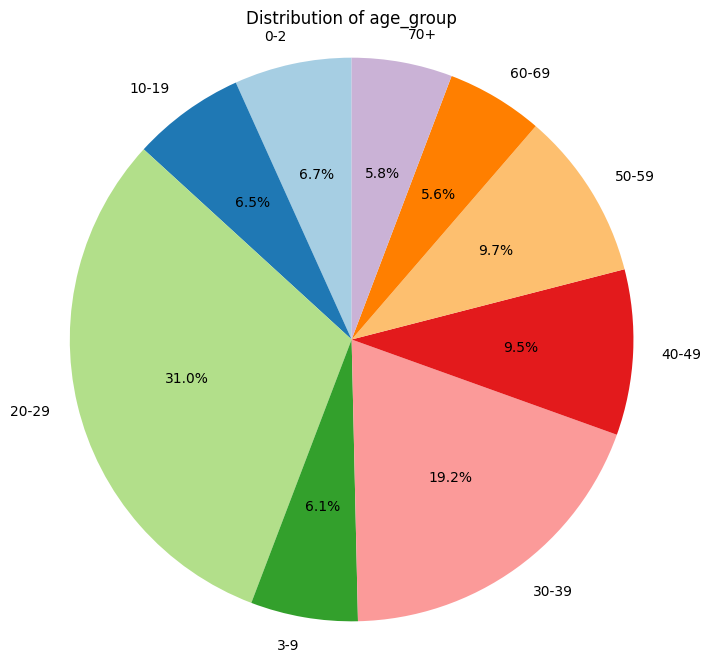

In [44]:
plot_pie_chart(df_labels_recognized, 'age_group', label_dict=age_group_labels)

#### Labels Distribution by Age Group

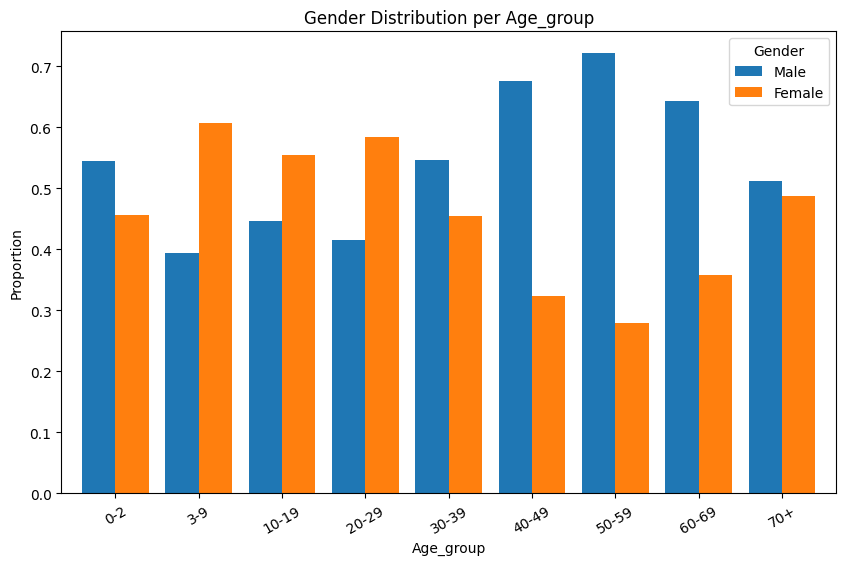

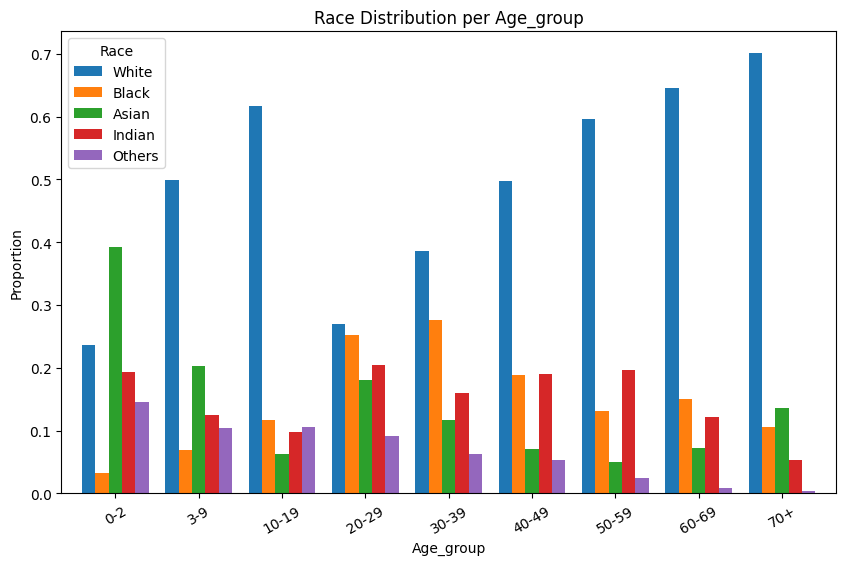

In [47]:
plot_grouped_bar(df_labels_recognized, 'age_group', 'gender', age_group_labels, gender_labels)
plot_grouped_bar(df_labels_recognized, 'age_group', 'race', age_group_labels, race_labels)

The analysis of the dataset's age group distribution reveals valuable insights regarding the balance and representation of different age groups. The pie chart illustrates the overall distribution, with the age group "20-29" being the most represented, followed by "30-39" and "40-49," while the senior categories such as "60-69" and "70+" are less represented. This highlights a potential skew toward younger individuals in the dataset, which could impact the model's generalization for older age groups.

The gender distribution chart across different age groups shows notable variation, with some age groups (such as "50-59" and "40-49") having a higher proportion of males, while others, like "3-9", "10-19", "19-29", show a higher proportion of females. This suggests gender imbalances in some age brackets, which could be considered during model training to ensure fairness.

Lastly, the race distribution plot demonstrates how racial representation fluctuates across age groups. For example, "White" individuals are highly represented in almost all age groups, particularly in the older age ranges, while other racial categories such as "Black," "Asian," and "Indian" have varying levels of representation. These racial disparities should be taken into account, as they might influence the model’s predictions and fairness for underrepresented groups.

Overall, this chapter emphasizes the need to address these imbalances when developing a classification model. Incorporating techniques such as data augmentation, sampling strategies, or class weighting may help mitigate potential biases and improve model performance across diverse age, gender, and race groups.

In [48]:
output_path = '../data/df_labels_recognized_final.csv'
df_labels_recognized.to_csv(output_path, index=False)

print(f"DataFrame saved.")

DataFrame saved.
